In [67]:
import numpy as np
import scipy as sp
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

from astropy.modeling.models import Gaussian1D

from astropy.timeseries import LombScargle
from astropy.convolution import convolve, Box1DKernel, Gaussian1DKernel

In [69]:
%matplotlib inline

In [70]:
plt.rcParams['figure.figsize'] = (10,8)
plt.rcParams['font.size'] = 12
plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.markersize'] = 17
plt.rcParams['axes.labelsize'] = 15
# plt.rcParams['savefig.transparent'] = False

# Convenience Functions

In [3]:
def calc_lomb_scargle(t,y):
   oversample = 10
   tmax = t.max()
   tmin = t.min()
   df = 1.0 / (tmax - tmin)
   fmin = df
   fmax = 600 # maximum frequency in cycles per day (c/d)
 
   freq = np.arange(fmin, fmax, df / oversample)
   model = LombScargle(t, y)
   sc = model.power(freq, method="fast", normalization="psd")
 
   fct = np.sqrt(4./len(t))
   amp = np.sqrt(sc) * fct
   return freq*11.574, amp*1E6 # return frequency in muHz and amplitude in ppm

In [16]:
def read_star(star_name,suppress_output=True,unpack=False):
#     delta_nu,nu_max,mass,lc,ps
    delta_nu = highmass_rc_newvals['Delnu'][highmass_rc_newvals['KIC']==float(star_name[4:])].values[0]
    nu_max = highmass_rc_newvals['numax'][highmass_rc_newvals['KIC']==float(star_name[4:])].values[0]
#         mass = highmass_rc_newvals['ClcorM'][highmass_rc_newvals['KIC']==float(star_name[4:])].values[0]
    mass = highmass_rc['ClcorM'][highmass_rc['KIC']==float(star_name[4:])].values[0]
    if suppress_output == False:
        print(star_name)
#         print('Using new values')
        print('delta_nu =',delta_nu)
        print('nu_max =',nu_max)
#         print('Jie mass =',mass)
    
    lightcurve = pd.read_csv('../data/highmass_rc/KIC'+star_name[4:]+'_LC.csv')
    powerspec = pd.read_csv('../data/highmass_rc/KIC'+star_name[4:]+'_PS.csv')
    if unpack == True:
        if suppress_output == False:
            print('unpacking data frames')
        time = np.asarray(lightcurve['time'])
        flux = np.asarray(lightcurve['flux'])
        freq = np.asarray(powerspec['freq'])
        power = np.asarray(powerspec['power'])
        amp = np.asarray(powerspec['amp'])
        return delta_nu,nu_max,mass,time,flux,freq,power,amp
    else:
        if suppress_output == False:
            print('returning dataframes')
        return delta_nu,nu_max,mass,lightcurve,powerspec

In [72]:
def replicated_grid_plot(star_name,time,flux,freq,power,save_output=True,smooth_percent=0.03,smoothvals=False):#,show_alt_LCs=True):
    delta_nu = highmass_rc_newvals['Delnu'][highmass_rc_newvals['KIC']==float(star_name[4:])].values[0]
    nu_max = highmass_rc_newvals['numax'][highmass_rc_newvals['KIC']==float(star_name[4:])].values[0]
#         mass = highmass_rc_newvals['ClcorM'][highmass_rc_newvals['KIC']==float(star_name[4:])].values[0]
#     if smoothvals == True:
#         nu_max = highmass_rc_newvals['smooth_numax'][highmass_rc_newvals['KIC']==float(star_name[4:])].values[0]
    mass = highmass_rc['ClcorM'][highmass_rc['KIC']==float(star_name[4:])].values[0]
    time = np.asarray(time)
    flux = np.asarray(flux)
    freq = np.asarray(freq)
    power = np.asarray(power)

#     fig = plt.figure(figsize=[15,8],constrained_layout=True)
    fig = plt.figure(figsize=[18,10],constrained_layout=True)

    gs = GridSpec(3, 2, figure=fig)
    ax1 = fig.add_subplot(gs[:, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[1, 1])
    ax4 = fig.add_subplot(gs[2, 1])

    freq_res = np.median(np.diff(freq))
#     power = convolve(power, Box1DKernel((delta_nu*0.03)/freq_res))
    z, ext = yl_echelle(freq, 
                     convolve(power, Box1DKernel((delta_nu*smooth_percent)/freq_res)),
                     delta_nu, 
                     fmin=nu_max*0.5, fmax=nu_max*1.5, echelletype="replicated")
    z = np.sqrt(z) #sqrt scaling
    ax1.imshow(z, extent=ext, aspect='auto', interpolation='nearest', cmap='BuPu')
#     echx, echy, echz = yl_echelle_older(freq,
#                                   convolve(power, Box1DKernel((delta_nu*smooth_percent)/freq_res)),
#                                   delta_nu,
#                                   fmin=nu_max*0.5,fmax=nu_max*1.5,echelletype="replicated")
#     echz = np.sqrt(echz)
#     levels = np.linspace(np.min(echz),np.max(echz),500)
#     ax1.contourf(echx,echy,echz,cmap='BuPu',levels=levels)
#     ax1.axis([np.min(echx),np.max(echx),np.min(echy),np.max(echy)])
    ax1.axis(ext)
    ax1.set_xlabel("Frequency mod "+str("{0:.2f}").format(delta_nu) + " ($\mu$Hz)")
    ax1.axvline(delta_nu,color='grey',linestyle='--',alpha=0.5)
    
#     echelle.plot_echelle(freq, power, delta_nu, scale='sqrt', smooth=True, ax=ax1,
#                         fmin=nu_max*0.5,fmax=nu_max*1.5,smooth_filter_width=(delta_nu*0.03)/freq_res)

    ax2.scatter(time,flux,s=5)
    ax2.set_xlabel('time')
    ax2.set_ylabel('flux')

    ax3.plot(freq,power,linewidth=1)
    ax3.plot(freq,convolve(power, Box1DKernel((delta_nu*smooth_percent)/freq_res)),linewidth=1,color='r')
    # ax3.set_ylim(0,500)
    ax3.set_xlim(0.5,250)
    ax3.set_xscale('log')
    ax3.set_yscale('log')
    ax3.set_xlabel(r'frequency ($\mu$Hz)')
    ax3.set_ylabel('power')


    ax4.plot(freq,power,linewidth=1)
    ax4.plot(freq,convolve(power, Box1DKernel((delta_nu*smooth_percent)/freq_res)),linewidth=1,color='r')
    ax4.axvline(nu_max,color='grey',linestyle='--',alpha=0.5,label='Jie numax')
    ax4.axvline(highmass_rc_newvals['new_numax'][highmass_rc_newvals['KIC']==float(star_name[4:])].values[0],
               color='tab:green',linestyle='--',alpha=0.5,label='pySYD numax')
    if smoothvals == True:
        ax4.axvline(highmass_rc_newvals['smooth_numax'][highmass_rc_newvals['KIC']==float(star_name[4:])].values[0],
                   color='tab:red',linestyle='--',alpha=0.5,label='smoothed numax')
        ax4.legend()
    subset = power[(nu_max*0.8 < freq) & (freq < nu_max*1.2)]
    peak = max(subset)
    if star_name == 'KIC 10384595':
        peak = 500
    ax4.set_ylim(0,peak*1.2)
#     ax4.set_ylim(0,600)
    ax4.set_xlim(nu_max*0.5,nu_max*1.5)
    ax4.set_xlabel(r'frequency ($\mu$Hz)')
    ax4.set_ylabel('power')

    new_mass = round(adjusted_masses['a_corr_mass'][adjusted_masses['KIC']==int(star_name[4:])].values[0],2)
    teff = highmass_rc_newvals['a_Teff'][highmass_rc_newvals['KIC']==int(star_name[4:])].values[0]
#     print(new_mass)
#     print(teff)
    fig.suptitle(star_name+', Jie M='+str(mass)+', APOGEE M='+str(new_mass)+', Teff='+str(teff),fontsize=20)
    if save_output == True:
        plt.savefig('../data/highmass_rc_smoothed/KIC'+star_name[4:]+'_rep')
    plt.show()

In [6]:
def yl_echelle(x, y, period, fmin=None, fmax=None, echelletype="single", offset=0.0):
    '''
    Make an echelle plot used in asteroseismology.
    
    Input parameters
    ----
    x: 1d array-like, freq
    y: 1d array-like, power spectrum
    period: float, length of each vertical stack (Dnu in a frequency echelle, DPi in a period echelle)
    fmin: float, minimum frequency to be plotted
    fmax: float, maximum frequency to be plotted
    echelletype: str, `single` or `replicated`
    offset: float, an amount by which the diagram is shifted horizontally
    
    Return
    ----
    z: a 2d numpy.array, folded power spectrum
    extent: a list, edges (left, right, bottom, top) 
    
    Users can create an echelle diagram with the following command:
    ----
    
    import matplotlib.pyplot as plt
    z, ext = echelle(freq, power, Dnu, fmin=numax-4*Dnu, fmax=numax+4*Dnu)
    plt.imshow(z, extent=ext, aspect='auto', interpolation='nearest')
    
    '''
    
    if fmin is None: fmin=0.
    if fmax is None: fmax=np.nanmax(x)

    fmin = fmin - offset
    fmax = fmax - offset
    x = x - offset

    fmin = 0.0 if fmin<0. else fmin - (fmin % period)

    # define plotting elements
    resolution = np.median(np.diff(x))
    # number of vertical stacks
    n_stack = int((fmax-fmin)/period) 
    # number of point per stack
    n_element = int(period/resolution) 

    fstart = fmin - (fmin % period)
    
    z = np.zeros([n_stack, n_element])
    base = np.linspace(0, period, n_element) if echelletype=='single' else np.linspace(0, 2*period, n_element)
    for istack in range(n_stack):
        z[-istack-1,:] = np.interp(fmin+istack*period+base, x, y)
    
    extent = (0, period, fstart, fstart+n_stack*period) if echelletype=='single' else (0, 2*period, fstart, fstart+n_stack*period)
        
    return z, extent

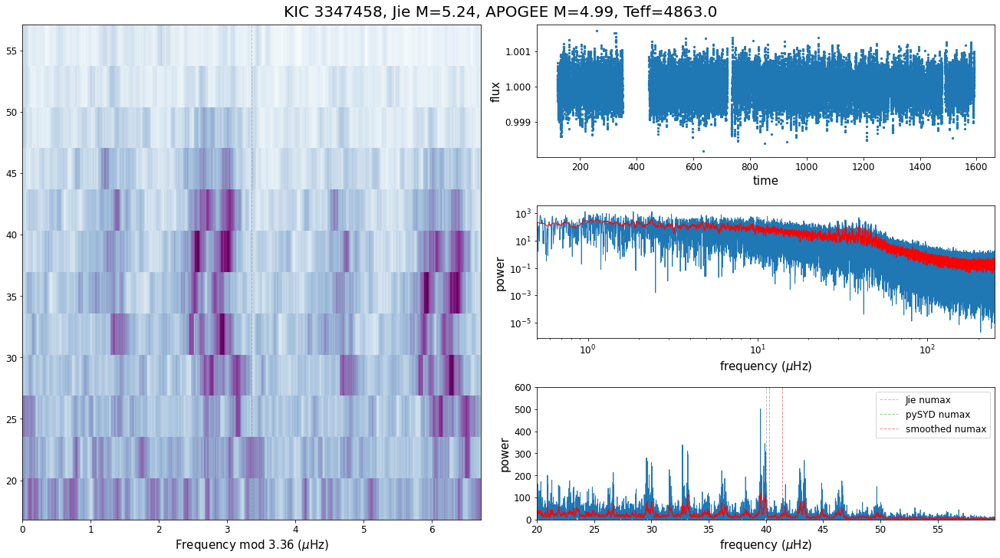

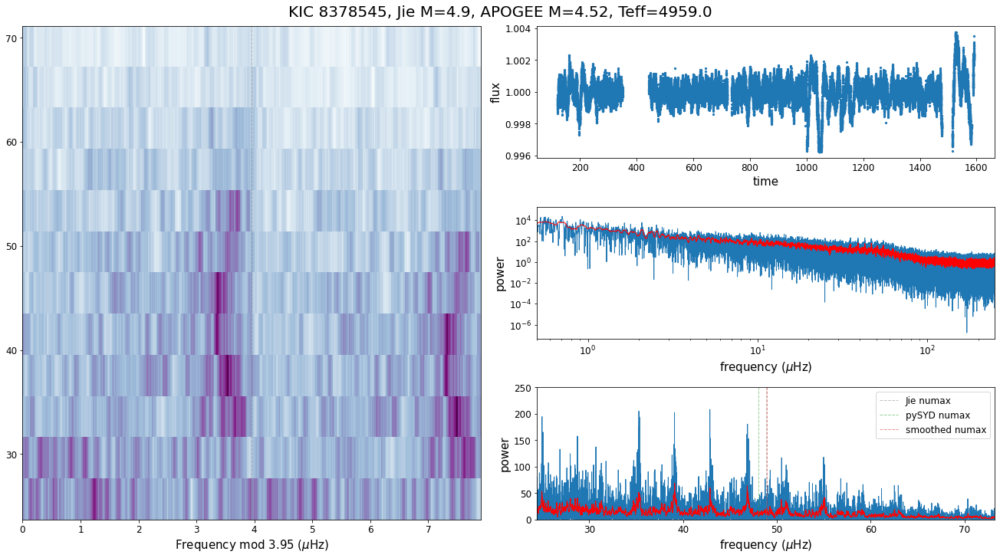

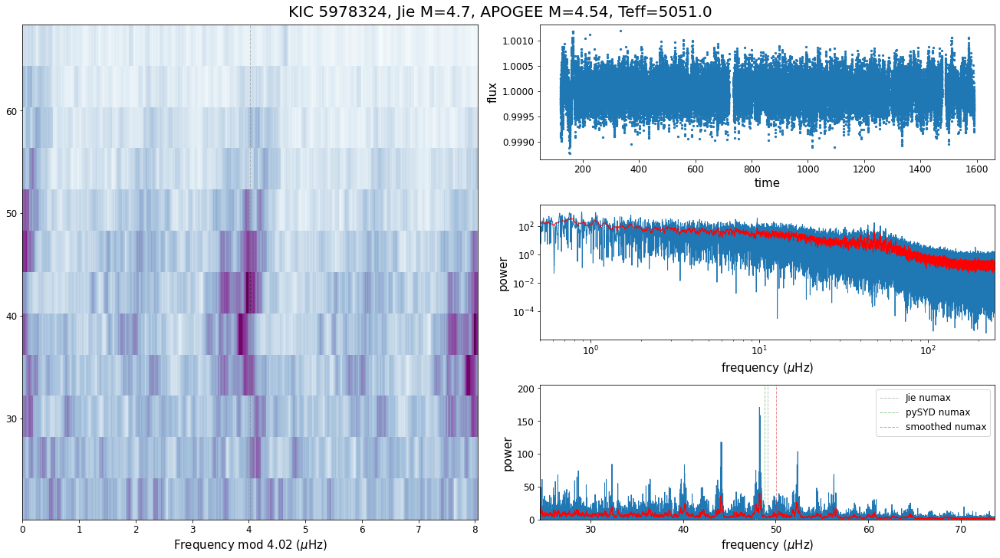

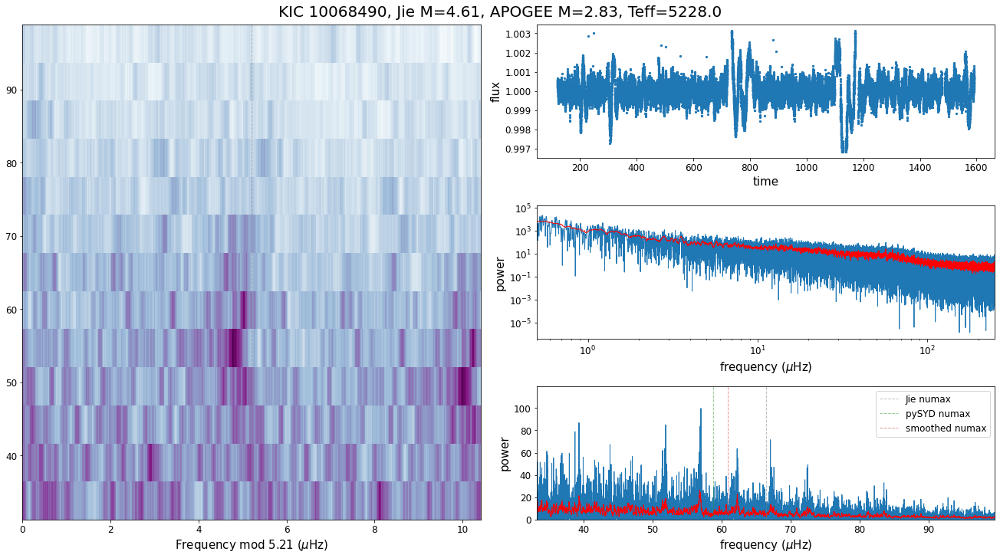

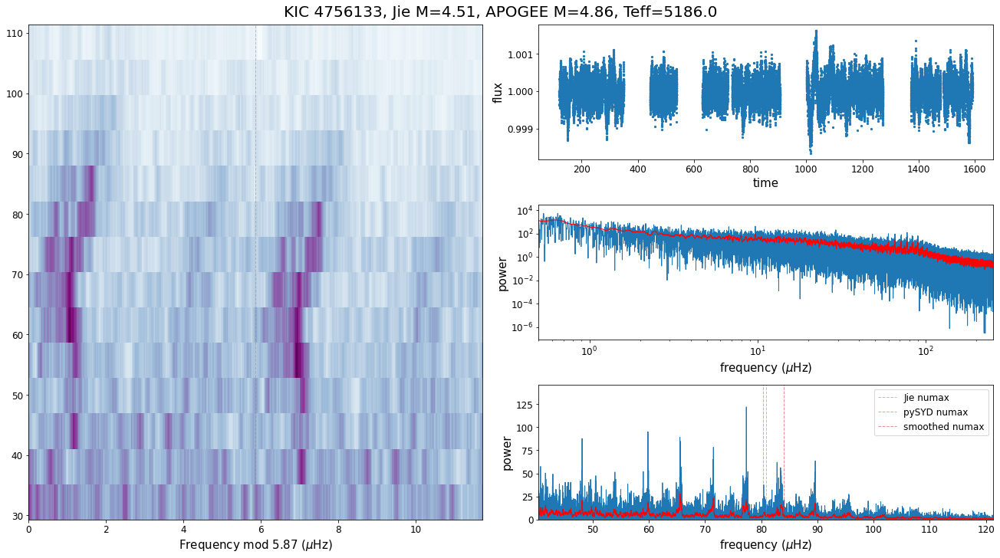

...

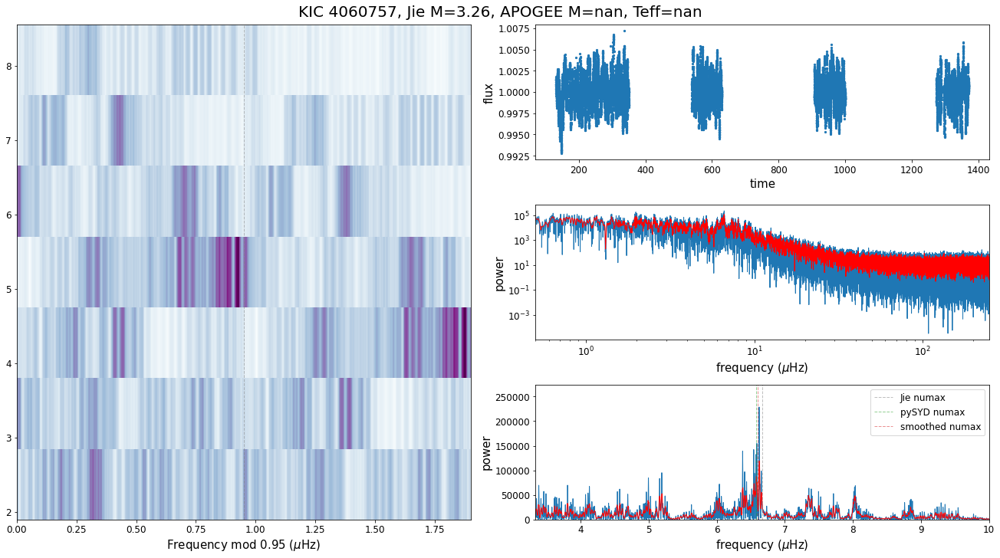

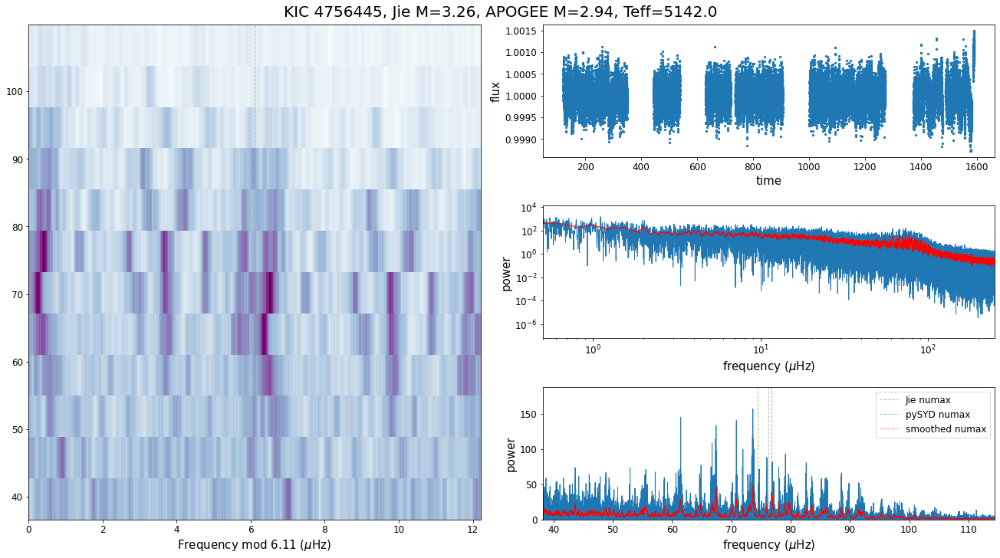

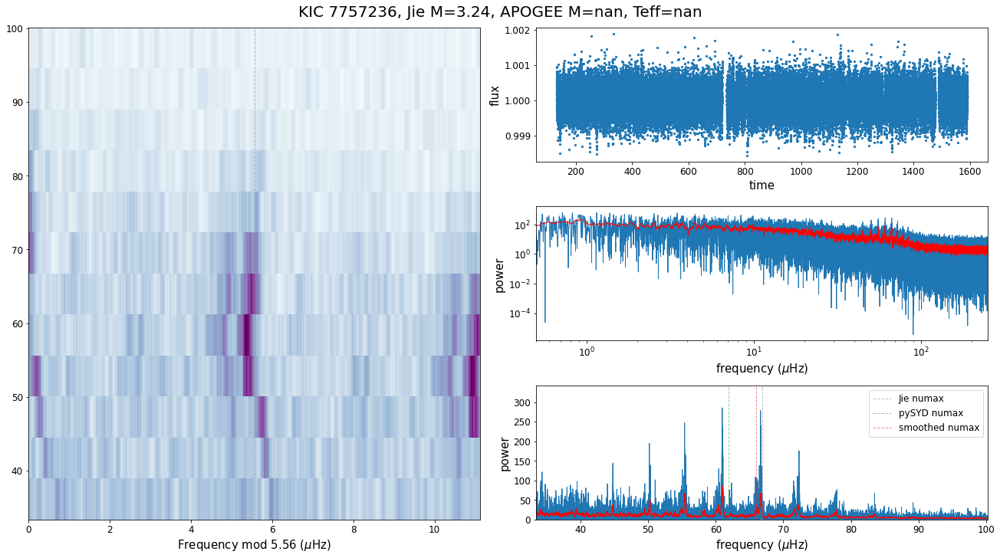

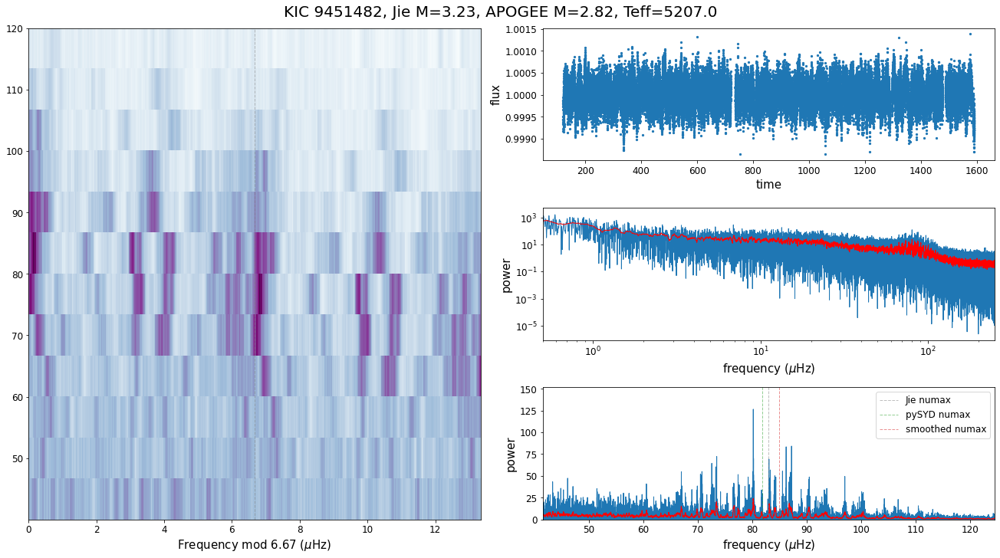

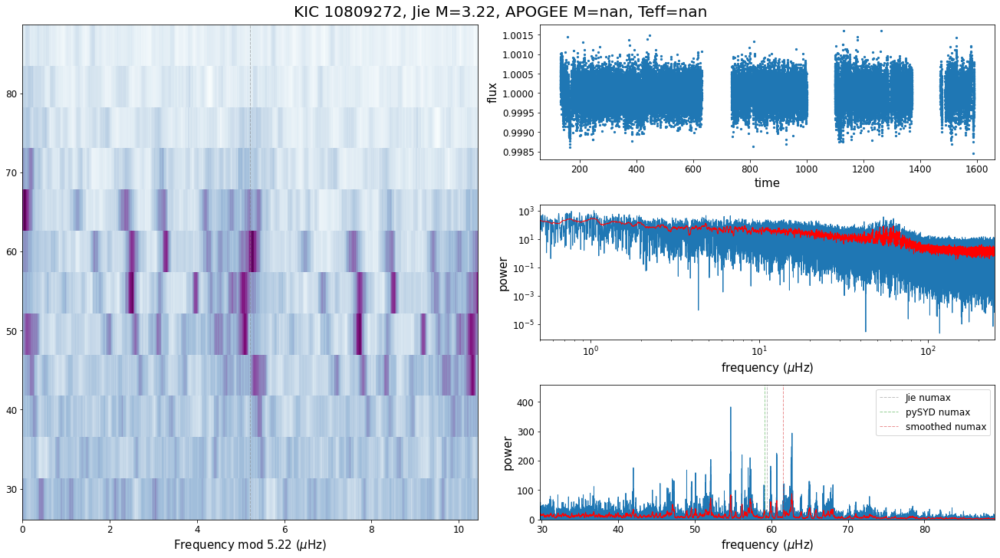

In [ ]:
for i in range(0,len(highmass_rc_newvals)):
    delta_nu,nu_max,mass,lightcurve,powerspec = read_star('KIC '+str(highmass_rc_newvals['KIC'][i]))
    replicated_grid_plot('KIC '+str(highmass_rc_newvals['KIC'][i]),lightcurve['time'],lightcurve['flux'],
                             powerspec['freq'],powerspec['power'],save_output=True,
                             smoothvals=True,smooth_percent=0.02)

# Read Files

In [7]:
highmass_rc = pd.read_csv('../datatables/highmass_rc_werr.csv')
highmass_rc

,KIC,Kpmag,QLen,DLen,numax,e_numax,Delnu,e_Delnu,A,Width,...,e_RGBcorR,ClcorM,e_ClcorM,ClcorR,e_ClcorR,Phase,M17,Simbad,_RA,_DE
0,3347458,10.30,17,1235.8,39.99,1.77,3.360,0.020,39.7,17.4,...,1.05,5.24,0.78,20.87,1.06,2,M17,Simbad,292.77283,38.432480
1,8378545,11.78,17,1235.5,48.82,4.01,3.977,0.040,23.0,22.9,...,1.57,4.90,1.24,18.21,1.57,2,M17,Simbad,296.26709,44.371861
2,5978324,10.96,18,1318.1,49.10,0.80,4.074,0.023,23.5,17.6,...,0.45,4.70,0.33,17.78,0.46,2,M17,Simbad,296.65195,41.222080
3,10068490,12.26,18,1317.7,66.42,5.52,5.206,0.076,13.7,19.1,...,1.32,4.61,1.20,15.04,1.35,2,M17,Simbad,289.05295,47.040981
4,4756133,10.58,14,974.9,80.81,2.22,5.994,0.030,19.9,31.3,...,0.45,4.51,0.43,13.51,0.45,2,M17,Simbad,294.38312,39.844940
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,10162765,11.12,15,1055.8,88.56,1.62,6.795,0.032,21.1,33.4,...,0.29,3.02,0.23,10.67,0.29,2,M17,Simbad,298.81076,47.142471
110,3430048,12.06,8,557.6,35.82,1.05,3.487,0.095,62.5,17.1,...,1.09,3.01,0.45,16.64,1.08,2,M17,Simbad,287.31088,38.598862
111,7116721,13.38,18,1317.9,50.86,1.45,4.522,0.017,48.4,20.8,...,0.49,3.01,0.31,14.00,0.50,2,M17,Simbad,291.45297,42.617050
112,7347076,13.66,17,1308.5,90.59,2.34,7.216,0.045,23.6,25.8,...,0.37,3.01,0.30,10.32,0.37,2,M17,Simbad,286.28159,42.939899


In [8]:
highmass_rc_newvals = pd.read_csv('../datatables/highmass_rc_newvals.csv')
highmass_rc_newvals

,KIC,numax,new_numax,smooth_numax,Delnu,o_Teff,o_log(g),o_[Fe/H],g_Teff,g_Teff_e,...,a_log(g),a_log(g)_e,a_[Fe/H],a_[Fe/H]_e,L_Teff,L_Teff_e,L_log(g),L_log(g)_e,L_[Fe/H],L_[Fe/H]_e
0,3347458,39.99,40.32,41.422682,3.360,5000,2.519,0.18,NaN,NaN,...,2.525,0.039,0.165,0.007,NaN,NaN,NaN,NaN,NaN,NaN
1,8378545,48.82,48.07,48.952072,3.952,5058,2.608,0.22,NaN,NaN,...,3.142,0.059,0.157,0.007,5009.00,32.00,2.761,0.053,0.323,0.030
2,5978324,49.10,48.78,50.072904,4.024,5051,2.610,-0.07,NaN,NaN,...,2.701,0.050,-0.098,0.008,NaN,NaN,NaN,NaN,NaN,NaN
3,10068490,66.42,58.84,60.906533,5.206,5189,2.747,-0.14,5740.95,4.38,...,2.769,0.062,-0.201,0.010,5254.75,37.05,2.699,0.061,-0.216,0.035
4,4756133,80.81,80.29,83.967767,5.865,5152,2.831,0.11,NaN,NaN,...,3.014,0.056,0.091,0.008,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,10162765,88.56,85.53,89.092562,6.760,4948,2.862,0.18,NaN,NaN,...,2.858,0.049,0.076,0.008,5099.89,22.44,2.974,0.034,0.085,0.018
110,3430048,35.82,33.63,37.856607,3.487,5079,2.474,0.17,NaN,NaN,...,2.502,0.039,0.106,0.007,NaN,NaN,NaN,NaN,NaN,NaN
111,7116721,50.86,50.97,53.768334,4.522,5028,2.624,-0.26,NaN,NaN,...,NaN,NaN,NaN,NaN,4798.39,26.51,2.677,0.044,0.049,0.025
112,7347076,90.59,90.65,94.236618,7.216,5386,2.890,-0.17,NaN,NaN,...,NaN,NaN,NaN,NaN,5076.47,46.21,2.915,0.076,-0.007,0.044


In [11]:
adjusted_masses = pd.read_csv('../datatables/adjusted_masses.csv')
adjusted_masses

,KIC,a_fdnu,a_uncorr_mass,a_corr_mass,a_corr_mass_e,a_gfdnu,a_gcorr_mass,L_fdnu,L_uncorr_mass,L_corr_mass,...,g_corr_mass,g_corr_mass_e,g_gfdnu,g_gcorr_mass,gs_fdnu,gs_uncorr_mass,gs_corr_mass,gs_corr_mass_e,gs_gfdnu,gs_gcorr_mass
0,3347458,1.027232,4.484905,4.993760,0.680731,1.027232,4.993760,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.012706,4.246364,4.466321,0.598001,1.012706,4.466321
1,8378545,1.025511,4.089198,4.522718,1.152732,1.025507,4.522652,1.032944,4.151199,4.725861,...,NaN,NaN,NaN,NaN,1.014711,3.914822,4.150319,1.052620,1.014711,4.150320
2,5978324,1.026530,4.086504,4.537730,0.275641,1.026530,4.537729,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.036339,4.229311,4.878397,0.267727,1.036339,4.878393
3,10068490,1.012618,2.695859,2.834523,0.818954,1.012618,2.834523,1.014573,2.716576,2.878423,...,3.346959,0.962042,1.019167,3.346957,1.022452,2.775138,3.032891,0.873864,1.022440,3.032750
4,4756133,1.037179,4.201008,4.861471,0.436295,1.037178,4.861460,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.019117,3.950818,4.261703,0.365146,1.019117,4.261708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,10162765,1.005711,2.753529,2.816966,0.185890,1.005711,2.816966,1.010315,2.806094,2.923683,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
110,3430048,0.990309,2.226199,2.141149,0.312692,0.990309,2.141149,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
111,7116721,NaN,NaN,NaN,NaN,NaN,NaN,0.994198,2.706808,2.644532,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
112,7347076,NaN,NaN,NaN,NaN,NaN,NaN,1.003907,2.555362,2.595532,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# An example star

stars for filtering: 3758731, 4348593, 4562675, 4756133, 5097690, 5104175, 5707338, 

In [20]:
delta_nu,nu_max,mass,lightcurve,powerspec = read_star('KIC 3758731',suppress_output=False)

KIC 3758731
delta_nu = 6.243
nu_max = 78.78
returning dataframes


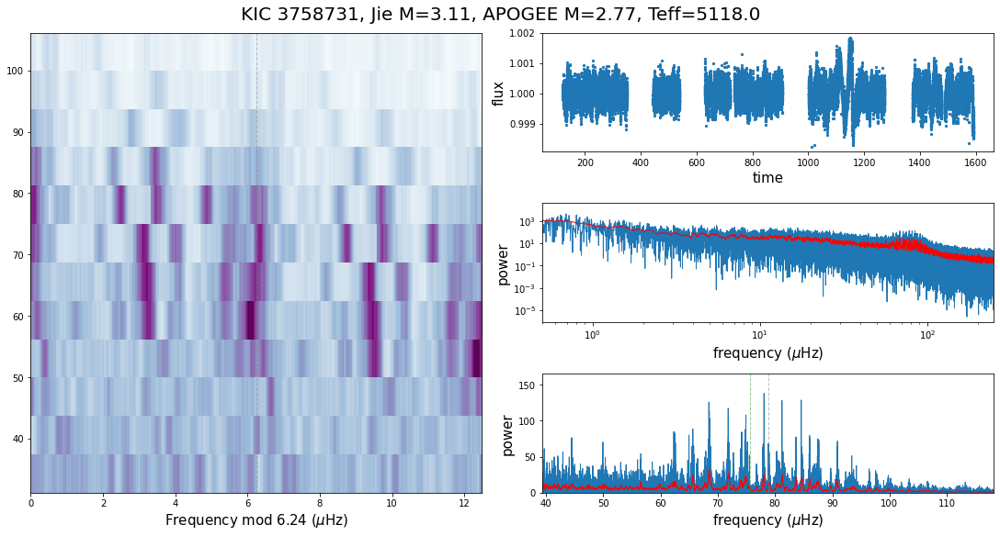

In [21]:
replicated_grid_plot('KIC 3758731',lightcurve['time'],lightcurve['flux'],
          powerspec['freq'],powerspec['power'],save_output=False)

# One way to highpass filter

Apply a strong smooth and divide the flux by the smoothed flux  
Maybe not the best for what we're doing here - will affect the background fit

In [23]:
flux = lightcurve['flux']
highlysmoothed_flux = convolve(flux, Gaussian1DKernel(20),boundary='extend')
hpfiltered_flux = flux/highlysmoothed_flux
freq,amp = calc_lomb_scargle(lightcurve['time'],hpfiltered_flux)

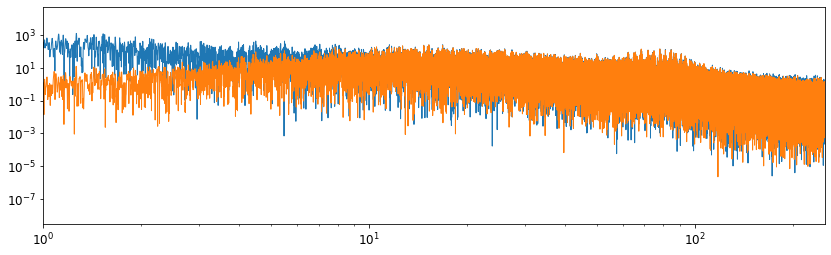

In [34]:
plt.figure(figsize=(14,4))
plt.plot(powerspec['freq'],powerspec['power'],label='normal')
plt.plot(freq,amp**2,label='filtered')
plt.xscale('log')
plt.yscale('log')
plt.xlim(1,250)
plt.show()

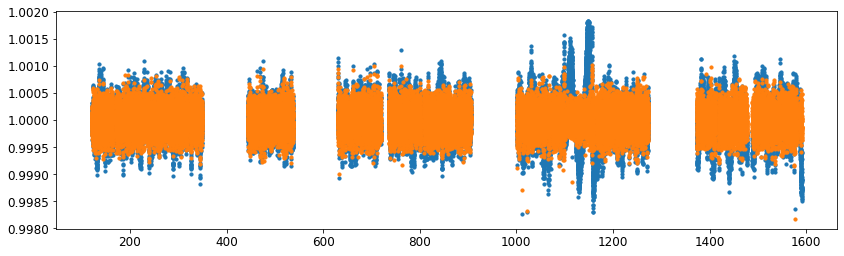

In [33]:
plt.figure(figsize=(14,4))
plt.scatter(lightcurve['time'],lightcurve['flux'],s=10)
plt.scatter(lightcurve['time'],hpfiltered_flux,s=10)
plt.show()

# Applying a filter of a particular width in days

In [44]:
flux = lightcurve['flux']

cadence = np.median(np.diff(lightcurve['time'])) # in this case this is 30 minute cadence
filter_days = 5
# so if you have some cadence in days and you want to filter out to 20 days:
# then thats 20/cadence width you need
filter_width = filter_days/cadence
print(filter_width)

highlysmoothed_flux = convolve(flux, Gaussian1DKernel(filter_width),boundary='extend')
hpfiltered_flux = flux/highlysmoothed_flux
freq,amp = calc_lomb_scargle(lightcurve['time'],hpfiltered_flux)

244.69456190506867


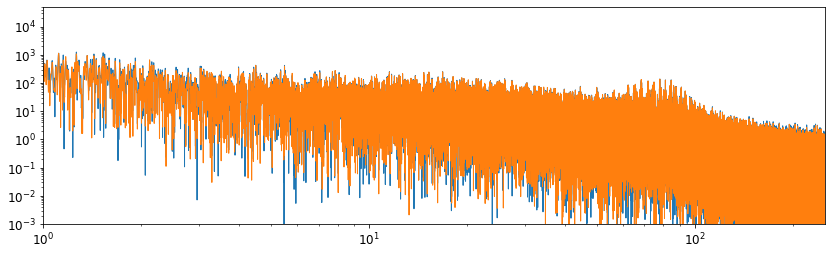

In [47]:
plt.figure(figsize=(14,4))
plt.plot(powerspec['freq'],powerspec['power'],label='normal')
plt.plot(freq,amp**2,label='filtered')
plt.xscale('log')
plt.yscale('log')
plt.xlim(1,250)
plt.ylim(bottom=10**(-3))
plt.show()

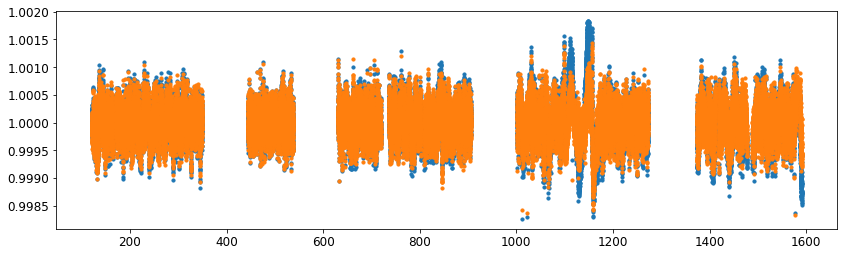

In [46]:
plt.figure(figsize=(14,4))
plt.scatter(lightcurve['time'],lightcurve['flux'],s=10)
plt.scatter(lightcurve['time'],hpfiltered_flux,s=10)
plt.show()

# Applying filter based on percentage of numax

In [57]:
flux = lightcurve['flux']

cadence = np.median(np.diff(lightcurve['time'])) # in this case this is 30 minute cadence
filter_freq = nu_max*0.1 # in uHz
print(filter_freq)
filter_period = 11.574/(filter_freq)
print(filter_period) # in days???
filter_width = filter_period/cadence
print(filter_width)

# filter_days = 5
# # so if you have some cadence in days and you want to filter out to 20 days:
# # then thats 20/cadence width you need
# filter_width = filter_days/cadence
# print(filter_width)

highlysmoothed_flux = convolve(flux, Gaussian1DKernel(filter_width),boundary='extend')
hpfiltered_flux = flux/highlysmoothed_flux
freq,amp = calc_lomb_scargle(lightcurve['time'],hpfiltered_flux)

7.878
1.4691546077684692
71.89882862374371


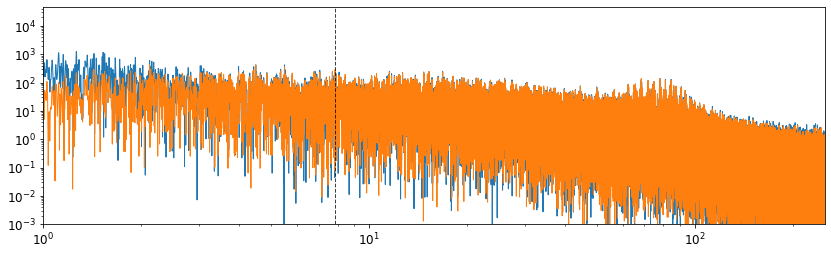

In [60]:
plt.figure(figsize=(14,4))
plt.plot(powerspec['freq'],powerspec['power'],label='normal')
plt.plot(freq,amp**2,label='filtered')
plt.axvline(filter_freq,color='k',linestyle='--',alpha=0.75)
plt.xscale('log')
plt.yscale('log')
plt.xlim(1,250)
plt.ylim(bottom=10**(-3))
plt.show()

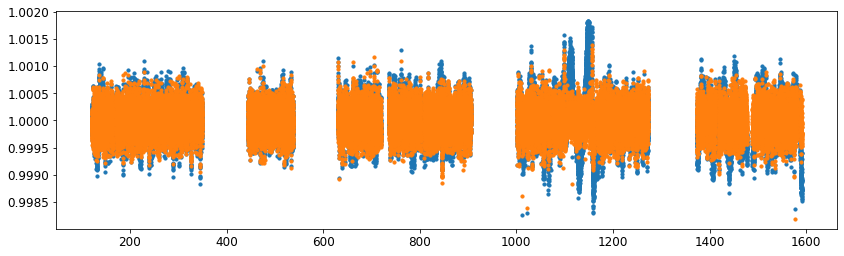

In [61]:
plt.figure(figsize=(14,4))
plt.scatter(lightcurve['time'],lightcurve['flux'],s=10)
plt.scatter(lightcurve['time'],hpfiltered_flux,s=10)
plt.show()